Running DIffuction text-to-image pipeline

In [ ]:
# Load this or install the requirements.txt
import sys
! pip install ipykernel
!{sys.executable} -m pip install torch diffusers transformers accelerate safetensors matplotlib Pillow ipython


In [2]:

import torch
from diffusers import StableDiffusionPipeline

import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import display

device = 'mps' if torch.backends.mps.is_available() else 'cpu'
devise = 'cuda' if torch.cuda.is_available() else device

print(f"Using device: {devise}")

/Users/stell/Desktop/semfe_lab/null_env/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
`CLIPImageProcessor` requires torchvision (not installed); falling back to `CLIPImageProcessorPil` for backward compatibility. Install torchvision to use the default backend, or import `CLIPImageProcessorPil` directly to silence this warning.
`SiglipImageProcessor` requires torchvision (not installed); falling back to `SiglipImageProcessorPil` for backward compatibility. Install torchvision to use the default backend, or import `SiglipImageProcessorPil` directly to silence this warning.


Using device: mps


In [3]:
pipe = StableDiffusionPipeline.from_pretrained(
	"stable-diffusion-v1-5/stable-diffusion-v1-5",
	use_auth_token=True, 
    safety_checker=None
).to(device)
print("pipeline loaded")

Keyword arguments {'use_auth_token': True} are not expected by StableDiffusionPipeline and will be ignored.
Loading weights: 100%|██████████| 196/196 [00:00<00:00, 9526.10it/s]]
CLIPTextModel LOAD REPORT from: /Users/stell/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 22.37it/s]
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered res

pipeline loaded


Generate image

100%|██████████| 50/50 [00:27<00:00,  1.79it/s]


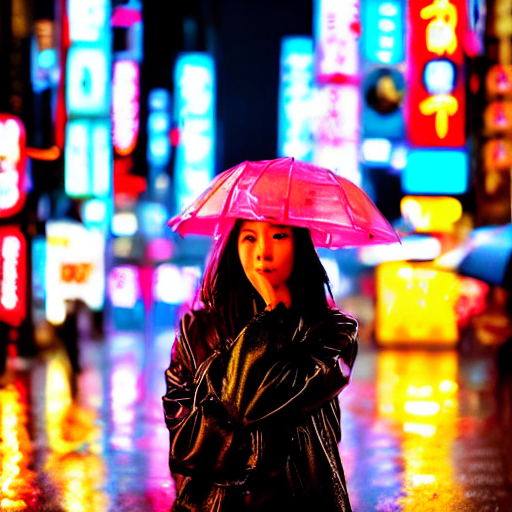

In [4]:
prompt = ("a cinematic portrait of a young woman standing in a rainy neon-lit street in Tokyo "
		  "at night, wet pavement reflecting colorful lights, shallow depth of field, "
		  "35mm photography, ultra detailed, soft lighting, bokeh, high contrast, "
		  "realistic skin texture, masterpiece, best quality")

image = pipe(prompt)[0][0]
display(image)

  0%|          | 0/50 [00:00<?, ?it/s]

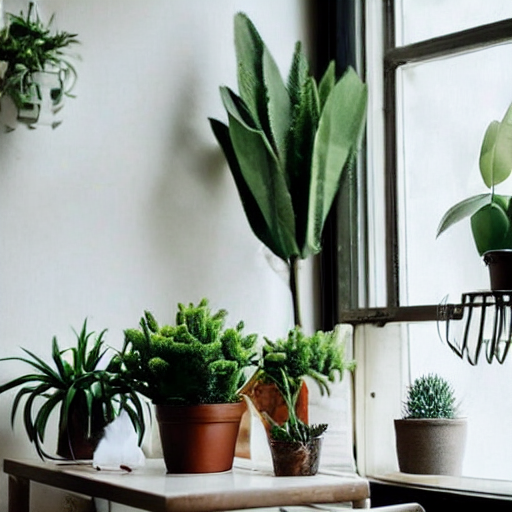

In [4]:
prompt = ("a table with a steaming cup of coffee,"
" a few green plants on the windowsill, "
"soft and warm lighting, simple and realistic style)")

image = pipe(prompt)
display(image[0][0])

## Diffusion Pipeline 

Training Procedure Stable Diffusion v1-5 is a latent diffusion model which combines an autoencoder with a diffusion model that is trained in the latent space of the autoencoder. During training,

Images are encoded through an encoder, which turns images into latent representations. The autoencoder uses a relative downsampling factor of 8 and maps images of shape H x W x 3 to latents of shape H/f x W/f x 4
Text prompts are encoded through a ViT-L/14 text-encoder.
The non-pooled output of the text encoder is fed into the UNet backbone of the latent diffusion model via cross-attention.
The loss is a reconstruction objective between the noise that was added to the latent and the prediction made by the UNet.


This model is composed of three basic compartments:

An autoencoder (VAE).

A U-Net.

A text-encoder, e.g. CLIP's Text Encoder.

## Architecture

In [6]:
print(pipe)

StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.37.1",
  "_name_or_path": "stable-diffusion-v1-5/stable-diffusion-v1-5",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}



In [7]:
print(pipe.unet)

UNet2DConditionModel(
  (conv_in): Conv2d(4, 320, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=320, out_features=1280, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=1280, out_features=1280, bias=True)
  )
  (down_blocks): ModuleList(
    (0): CrossAttnDownBlock2D(
      (attentions): ModuleList(
        (0-1): 2 x Transformer2DModel(
          (norm): GroupNorm(32, 320, eps=1e-06, affine=True)
          (proj_in): Conv2d(320, 320, kernel_size=(1, 1), stride=(1, 1))
          (transformer_blocks): ModuleList(
            (0): BasicTransformerBlock(
              (norm1): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
              (attn1): Attention(
                (to_q): Linear(in_features=320, out_features=320, bias=False)
                (to_k): Linear(in_features=320, out_features=320, bias=False)
                (to_v): Linear(in_features=320, out_fe

## Theory

Prompt text 

   ▼

Tokenizer (CLIPTokenizer)

   ▼
   
Text Encoder (CLIPTextModel) → embeddings

   ▼

Latent initialization

   ▼

Diffusion Loop: UNet + Scheduler (per timestep)

   ▼

VAE decode → final image

   ▼
   
Optional Safety Checker

# UNet structure

 - You have down_blocks (encoder) that reduce spatial resolution and extract features.

 - You have up_blocks (decoder) that restore spatial resolution and combine features via skip connections.

# Timestep conditioning

- The time_proj + time_embedding is used in every Resnet block to condition the network on the current diffusion step, i.e.,
 how much noise has been added and therefore how much to denoise.

# Cross-attention layers

- The CrossAttnDownBlock2D / CrossAttnUpBlock2D show that this UNet uses text embeddings (or other condition embeddings)
 to guide the generation.

# Resnet blocks + attention
- Resnet blocks handle local feature extraction.
- Transformer-based attention layers handle long-range dependencies in the image 
(so parts of the image can influence other parts).
# Input/output channels
The model takes a latent (usually 4-channel latent of the noisy image) as input.
Outputs a latent of the same size, which is progressively denoised across timesteps.

In [5]:
prompt_embeds, _ = pipe.encode_prompt(
    "a cyberpunk city",
    device=pipe.device,
    num_images_per_prompt=1,
    do_classifier_free_guidance=True  # ⬅️ Creates [cond, uncond] stack
)
print(prompt_embeds.shape)
print(prompt_embeds)

torch.Size([1, 77, 768])
tensor([[[-0.3884,  0.0229, -0.0522,  ..., -0.4899, -0.3066,  0.0675],
         [ 0.0290, -1.3258,  0.3085,  ..., -0.5257,  0.9768,  0.6652],
         [ 0.7860, -0.0640,  2.0189,  ..., -0.6660, -0.9544,  0.2847],
         ...,
         [ 1.8033,  1.4855, -0.3769,  ...,  1.0353, -0.9041, -0.3293],
         [ 1.8239,  1.4788, -0.3681,  ...,  1.0444, -0.9098, -0.3527],
         [ 1.7773,  1.4716, -0.3576,  ...,  1.0232, -0.8204, -0.3489]]],
       device='mps:0', grad_fn=<ViewBackward0>)


/Users/stell/Desktop/semfe_lab/semfe_lab/lib/python3.10/site-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py:903: FutureWarning: `callback_steps` is deprecated and will be removed in version 1.0.0. Passing `callback_steps` as an input argument to `__call__` is deprecated, consider using `callback_on_step_end`
  deprecate(


  0%|          | 0/20 [00:00<?, ?it/s]

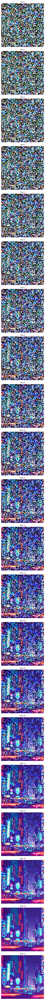

In [ ]:
step_images = []

# Callback function to capture intermediate images at each step of the diffusion process
def capture_step(pipe, step, timestep, callback_kwargs):
    latents = callback_kwargs["latents"]
    
    scaled_latents = latents / pipe.vae.config.scaling_factor
    image = pipe.vae.decode(scaled_latents).sample
    image = (image / 2 + 0.5).clamp(0, 1)
    
    img_np = image.cpu().permute(0, 2, 3, 1).float().numpy()
    step_images.append(Image.fromarray((img_np[0] * 255).astype("uint8")))

    return callback_kwargs

# Run the pipeline with the callback to capture intermediate images
pipe(
    "a cyberpunk city at night, neon lights",
    num_inference_steps=20,
    callback_on_step_end=capture_step,
    callback_steps=1 
)

# Display the captured images for each step
fig, axes = plt.subplots(len(step_images), 1, figsize=(8, 4 * len(step_images)))
for i, (ax, img) in enumerate(zip(axes, step_images), start=1):
    ax.imshow(img)
    ax.set_title(f"Step {i}", fontsize=9)
    ax.axis("off")
plt.tight_layout()
plt.show()